#### Sarah Hosseini, Hossein Yahyaei

In [3]:
%pip install bertviz
%pip install transformers


[notice] A new release of pip is available: 23.2.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip



     -------------------------------------- 157.6/157.6 kB 1.1 MB/s eta 0:00:00
  Obtaining dependency information for transformers>=2.0 from https://files.pythonhosted.org/packages/ad/67/b4d6a51dcaf988cb45b31e26c6e33fb169fe34ba5fb168b086309bd7c028/transformers-4.37.1-py3-none-any.whl.metadata
     -------------------------------------- 129.4/129.4 kB 2.5 MB/s eta 0:00:00
  Obtaining dependency information for boto3 from https://files.pythonhosted.org/packages/db/b6/b67b43624d5b0899915b9251b83fb59b0849ade59301b408dc6bfed53a3e/boto3-1.34.29-py3-none-any.whl.metadata
  Obtaining dependency information for regex from https://files.pythonhosted.org/packages/83/eb/144d2db5cf2ac3989d0ea4273040218d68bd67422133548da47043423594/regex-2023.12.25-cp310-cp310-win_amd64.whl.metadata
     -------------------------------------- 42.0/42.0 kB 675.2 kB/s eta 0:00:00
     -------------------------------------- 977.5/977.5 kB 2.3 MB/s eta 0:00:00
  Obtaining dependency information for huggingface-hub<1.0


[notice] A new release of pip is available: 23.2.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [92]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import torch.nn.functional as F
from transformers import AutoTokenizer, AutoModel
from transformers import AutoModel
import torch
from transformers import BertTokenizer, BertModel
from bertviz import head_view
from bertviz import model_view
import seaborn as sns
import plotly.graph_objs as go
import nltk
from nltk.corpus import stopwords
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from nltk import pos_tag
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import string
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
import matplotlib.gridspec as gridspec


In [42]:
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt')
stopwords_list = set(stopwords.words('english'))
# Initialize BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Windows10\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [33]:
data = pd.read_csv("snli_1.0_train.csv")
data.head(5)

,gold_label,sentence1_binary_parse,sentence2_binary_parse,sentence1_parse,sentence2_parse,sentence1,sentence2,captionID,pairID,label1,label2,label3,label4,label5
0,neutral,( ( ( A person ) ( on ( a horse ) ) ) ( ( jump...,( ( A person ) ( ( is ( ( training ( his horse...,(ROOT (S (NP (NP (DT A) (NN person)) (PP (IN o...,(ROOT (S (NP (DT A) (NN person)) (VP (VBZ is) ...,A person on a horse jumps over a broken down a...,A person is training his horse for a competition.,3416050480.jpg#4,3416050480.jpg#4r1n,neutral,NaN,NaN,NaN,NaN
1,contradiction,( ( ( A person ) ( on ( a horse ) ) ) ( ( jump...,( ( A person ) ( ( ( ( is ( at ( a diner ) ) )...,(ROOT (S (NP (NP (DT A) (NN person)) (PP (IN o...,(ROOT (S (NP (DT A) (NN person)) (VP (VBZ is) ...,A person on a horse jumps over a broken down a...,"A person is at a diner, ordering an omelette.",3416050480.jpg#4,3416050480.jpg#4r1c,contradiction,NaN,NaN,NaN,NaN
2,entailment,( ( ( A person ) ( on ( a horse ) ) ) ( ( jump...,"( ( A person ) ( ( ( ( is outdoors ) , ) ( on ...",(ROOT (S (NP (NP (DT A) (NN person)) (PP (IN o...,(ROOT (S (NP (DT A) (NN person)) (VP (VBZ is) ...,A person on a horse jumps over a broken down a...,"A person is outdoors, on a horse.",3416050480.jpg#4,3416050480.jpg#4r1e,entailment,NaN,NaN,NaN,NaN
3,neutral,( Children ( ( ( smiling and ) waving ) ( at c...,( They ( are ( smiling ( at ( their parents ) ...,(ROOT (NP (S (NP (NNP Children)) (VP (VBG smil...,(ROOT (S (NP (PRP They)) (VP (VBP are) (VP (VB...,Children smiling and waving at camera,They are smiling at their parents,2267923837.jpg#2,2267923837.jpg#2r1n,neutral,NaN,NaN,NaN,NaN
4,entailment,( Children ( ( ( smiling and ) waving ) ( at c...,( There ( ( are children ) present ) ),(ROOT (NP (S (NP (NNP Children)) (VP (VBG smil...,(ROOT (S (NP (EX There)) (VP (VBP are) (NP (NN...,Children smiling and waving at camera,There are children present,2267923837.jpg#2,2267923837.jpg#2r1e,entailment,NaN,NaN,NaN,NaN


In [17]:
data.shape

(550152, 14)

In [5]:
data.columns.tolist()

['gold_label',
 'sentence1_binary_parse',
 'sentence2_binary_parse',
 'sentence1_parse',
 'sentence2_parse',
 'sentence1',
 'sentence2',
 'captionID',
 'pairID',
 'label1',
 'label2',
 'label3',
 'label4',
 'label5']

In [6]:
data.describe()

,gold_label,sentence1_binary_parse,sentence2_binary_parse,sentence1_parse,sentence2_parse,sentence1,sentence2,captionID,pairID,label1,label2,label3,label4,label5
count,550152,550152,550146,550152,550152,550152,550146,550152,550152,550152,39370,39395,39383,36914
unique,4,150736,479906,150736,479908,150736,480040,151196,550152,3,3,3,3,3
top,entailment,( ( ( A dog ) ( in ( a field ) ) ) . ),( ( A man ) ( ( is sleeping ) . ) ),(ROOT (NP (NP (DT A) (NN dog)) (PP (IN in) (NP...,(ROOT (S (NP (DT A) (NN man)) (VP (VBZ is) (VP...,A dog in a field.,A man is sleeping.,171211612.jpg#4,3416050480.jpg#4r1n,neutral,contradiction,contradiction,contradiction,entailment
freq,183416,33,335,33,335,33,335,15,1,183384,13478,13728,13701,12768


In [34]:
data = data.drop_duplicates()
data.shape

(550152, 14)

In [8]:
data.isna().sum()

gold_label                     0
sentence1_binary_parse         0
sentence2_binary_parse         6
sentence1_parse                0
sentence2_parse                0
sentence1                      0
sentence2                      6
captionID                      0
pairID                         0
label1                         0
label2                    510782
label3                    510757
label4                    510769
label5                    513238
dtype: int64

In [35]:
data.dropna(subset=['sentence2'], inplace=True)

In [36]:
data = data[["sentence1", "sentence2", "gold_label"]]

In [11]:
data

,sentence1,sentence2,gold_label
0,A person on a horse jumps over a broken down a...,A person is training his horse for a competition.,neutral
1,A person on a horse jumps over a broken down a...,"A person is at a diner, ordering an omelette.",contradiction
2,A person on a horse jumps over a broken down a...,"A person is outdoors, on a horse.",entailment
3,Children smiling and waving at camera,They are smiling at their parents,neutral
4,Children smiling and waving at camera,There are children present,entailment
...,...,...,...
550147,Four dirty and barefooted children.,four kids won awards for 'cleanest feet',contradiction
550148,Four dirty and barefooted children.,"four homeless children had their shoes stolen,...",neutral
550149,A man is surfing in a bodysuit in beautiful bl...,A man in a bodysuit is competing in a surfing ...,neutral
550150,A man is surfing in a bodysuit in beautiful bl...,A man in a business suit is heading to a board...,contradiction


In [12]:
data.gold_label.unique()

array(['neutral', 'contradiction', 'entailment', '-'], dtype=object)

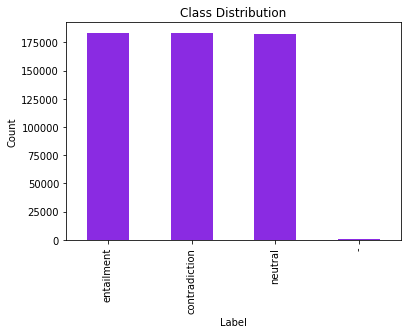

In [20]:
# Class Distribution Analysis
class_distribution = data['gold_label'].value_counts()
class_distribution.plot(kind='bar', color='blueviolet')
plt.title('Class Distribution')
plt.xlabel('Label')
plt.ylabel('Count')
plt.show()

In [37]:
data = data[data['gold_label'] != '-']

In [22]:
data.gold_label.unique()

array(['neutral', 'contradiction', 'entailment'], dtype=object)

entailment       183414
contradiction    183185
neutral          182762
Name: gold_label, dtype: int64


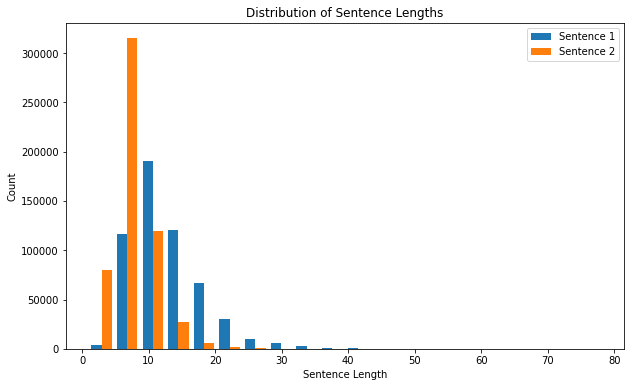

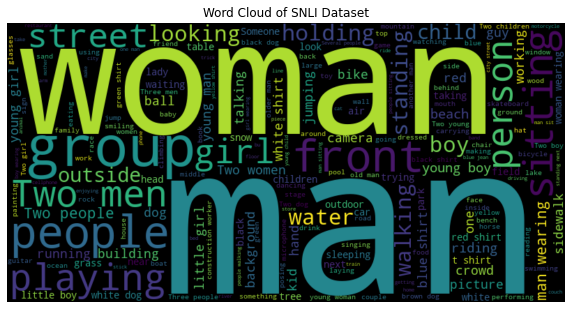

In [38]:
# Class distribution
class_counts = data['gold_label'].value_counts()
print(class_counts)

# Sentence length distribution
sentence1_length = data['sentence1'].apply(lambda x: len(str(x).split()))
sentence2_length = data['sentence2'].apply(lambda x: len(str(x).split()))

# Plot sentence length distribution
plt.figure(figsize=(10, 6))
plt.hist([sentence1_length, sentence2_length], bins=20, label=['Sentence 1', 'Sentence 2'])
plt.xlabel('Sentence Length')
plt.ylabel('Count')
plt.title('Distribution of Sentence Lengths')
plt.legend()
plt.show()

# Visualization
# Word cloud of most common words
all_sentences = ' '.join(data['sentence1'].tolist() + data['sentence2'].tolist())
wordcloud = WordCloud(width=800, height=400).generate(all_sentences)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of SNLI Dataset')
plt.show()

In [48]:
# Word Frequency Analysis
premise_words = [token.casefold() for sentence in data['sentence1'] for token in tokenizer.tokenize(sentence) if token.casefold() not in stopwords_list and token.isalpha()]
hypothesis_words = [token.casefold() for sentence in data['sentence2'] for token in tokenizer.tokenize(sentence) if token.casefold() not in stopwords_list and token.isalpha()]
premise_freq = Counter(premise_words)
hypothesis_freq = Counter(hypothesis_words)

In [49]:
# Top 10 most common words in premise
top_premise_words = premise_freq.most_common(10)
print('Top 10 most common words in premise:')
for word, count in top_premise_words:
    print(f'{word}: {count}')

Top 10 most common words in premise:
man: 151918
woman: 79007
two: 75748
people: 60205
wearing: 60205
shirt: 57242
white: 50465
black: 47326
young: 46762
blue: 43075


In [50]:
# Top 10 most common words in hypothesis
top_hypothesis_words = hypothesis_freq.most_common(10)
print('Top 10 most common words in hypothesis:')
for word, count in top_hypothesis_words:
    print(f'{word}: {count}')

Top 10 most common words in hypothesis:
man: 114462
people: 60960
woman: 58705
two: 46527
playing: 29429
men: 27690
girl: 25470
boy: 24996
dog: 23576
outside: 22350


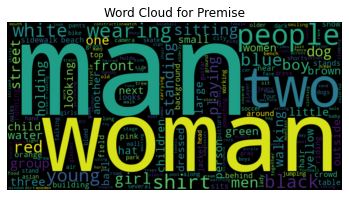

In [51]:
# Word Cloud for premise
premise_wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(premise_freq)
plt.imshow(premise_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Premise')
plt.show()

In [ ]:
# N-gram Analysis
ngram_range = (2, 2)
vectorizer = CountVectorizer(ngram_range=ngram_range, tokenizer=tokenizer.tokenize, stop_words=list(stopwords.words('english')))
ngrams = vectorizer.fit_transform(data['sentence1'])

In [57]:
ngram_freq = zip(vectorizer.get_feature_names_out(), ngrams.sum(axis=0).tolist()[0])
top_ngrams = sorted(ngram_freq, key=lambda x: x[1], reverse=True)[:10]
print(f'Top 10 most common {ngram_range}-grams:')
for ngram, count in top_ngrams:
    print(f'{ngram}: {count}')

Top 10 most common (2, 2)-grams:
two men: 14812
man wearing: 13762
street .: 12080
group people: 11047
water .: 9815
background .: 9240
, one: 8986
young boy: 8316
two people: 7996
blue shirt: 7643


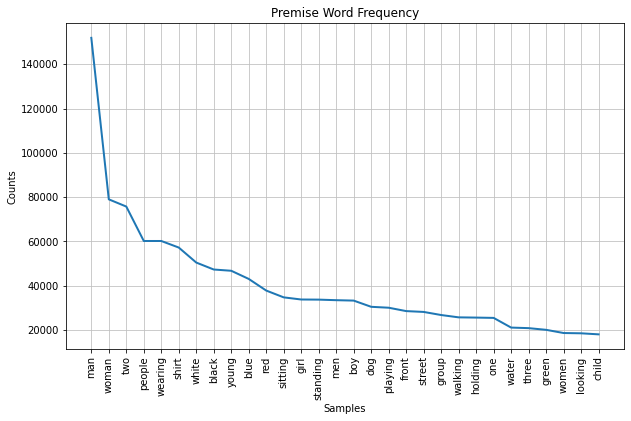

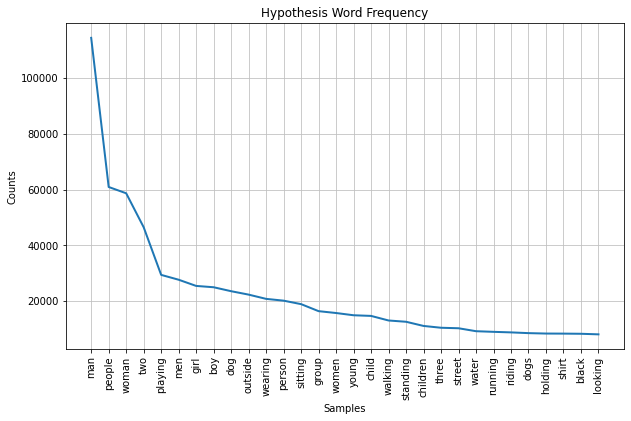

In [86]:
# Compute word frequencies
premise_freqdist = FreqDist(premise_words)
hypothesis_freqdist = FreqDist(hypothesis_words)

# Create the first plot for premise word frequency
plt.figure(figsize=(10, 6))
premise_freqdist.plot(30, cumulative=False, title='Premise Word Frequency')

# Create the second plot for hypothesis word frequency
plt.figure(figsize=(10, 6))
hypothesis_freqdist.plot(30, cumulative=False, title='Hypothesis Word Frequency')

# Show the plots
plt.show()

In [ ]:
premise_pos_tags = [tag for sentence in data['sentence1'] for _, tag in nltk.pos_tag(word_tokenize(sentence))]
hypothesis_pos_tags = [tag for sentence in data['sentence2'] for _, tag in nltk.pos_tag(word_tokenize(sentence))]

# Compute POS tag frequencies
premise_pos_freqdist = FreqDist(premise_pos_tags)
hypothesis_pos_freqdist = FreqDist(hypothesis_pos_tags)

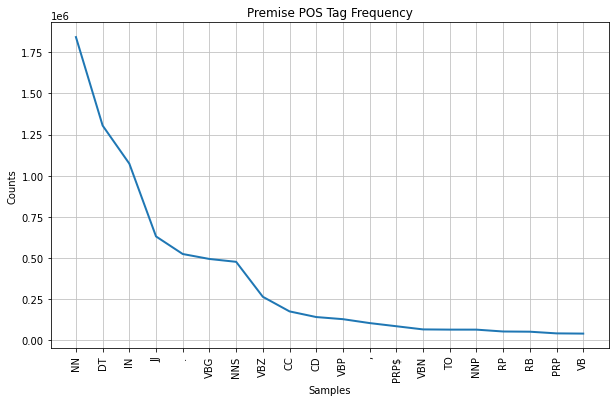

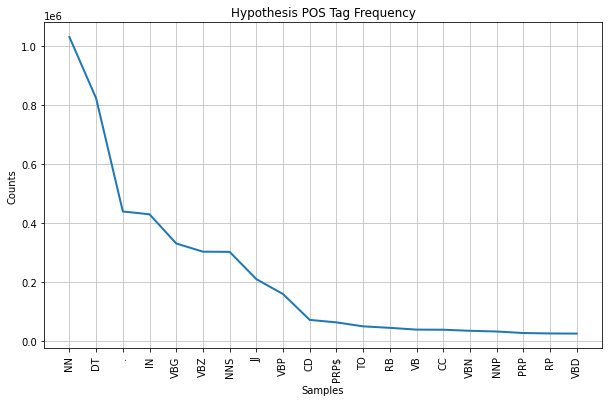

In [87]:
# Create the first plot for premise POS tag frequency
plt.figure(figsize=(10, 6))
premise_pos_freqdist.plot(20, cumulative=False, title='Premise POS Tag Frequency')

# Create the second plot for hypothesis POS tag frequency
plt.figure(figsize=(10, 6))
hypothesis_pos_freqdist.plot(20, cumulative=False, title='Hypothesis POS Tag Frequency')

# Show the plots
plt.show()

In [88]:
def compute_lexical_overlap(row):
    premise_tokens = set(word_tokenize(row['sentence1']))
    hypothesis_tokens = set(word_tokenize(row['sentence2']))
    overlap = len(premise_tokens.intersection(hypothesis_tokens))
    return overlap / len(premise_tokens.union(hypothesis_tokens))

data['lexical_overlap'] = data.apply(compute_lexical_overlap, axis=1)

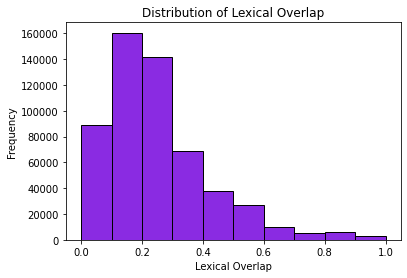

In [91]:
# Create histogram
plt.hist(data['lexical_overlap'], bins=10, edgecolor='black', color='blueviolet')

# Set labels and title
plt.xlabel('Lexical Overlap')
plt.ylabel('Frequency')
plt.title('Distribution of Lexical Overlap')

# Display the plot
plt.show()

In [94]:
data.describe()

,lexical_overlap
count,549361.000000
mean,0.247557
std,0.170182
min,0.000000
25%,0.125000
50%,0.210526
75%,0.333333
max,1.000000


In [95]:
def attention_calculation(querys, keys, values, masked=False):
    D = querys.shape[-1]
    T = querys.shape[-2]
                              # query <B,L,D> ,  key <B,J,D>
    similarity = torch.einsum("bld, bjd -> blj", querys, keys)*(D**-0.5)
    
    if masked:
        masked = torch.tril(torch.ones((T,T)))
        similarity = similarity.masked_fill(masked == 0, float('-inf'))

    attention = F.softmax(similarity, dim=-1)
    # weighted_values = torch.einsum("blj, bjd -> bld", attention, values)
    return attention

In [96]:
def embed_and_calc_attention():
    # choose random row
    random_row = data.sample(n=1)
    sentence1 = random_row['sentence1'].item()
    sentence2 = random_row['sentence2'].item()
    rel = random_row['gold_label'].item()
    print(sentence1, '-', sentence2, '-', rel)

    #sentence1 = "[CLS]" + sentence1 + "[SEP]"
    #sentence2 = "[CLS]" + sentence2 + "[SEP]"

    tokens1 = tokenizer.tokenize(sentence1)
    tokens2 = tokenizer.tokenize(sentence2)
        
    # Filter out stopwords and unnecessary words
    filtered_tokens1 = [token for token in tokens1 if token.casefold() not in stopwords_list and token.isalpha()]
    filtered_tokens2 = [token for token in tokens2 if token.casefold() not in stopwords_list and token.isalpha()]
    
    # Print the filtered tokens
    print(filtered_tokens1)
    print(filtered_tokens2)

    ids1 = tokenizer.convert_tokens_to_ids(filtered_tokens1)
    ids2 = tokenizer.convert_tokens_to_ids(filtered_tokens2)

    print(ids1, ids2)

    model = AutoModel.from_pretrained("bert-base-uncased")

    input_ids1 = torch.tensor([ids1])
    input_ids2 = torch.tensor([ids2])

    embeddings1 = model(input_ids1)[0]
    embeddings2 = model(input_ids2)[0]

    attention = attention_calculation(embeddings1, embeddings2, embeddings2)

    return filtered_tokens1, filtered_tokens2, attention
    

In [122]:
def visualize_random_pair_attention():
    sequence1, sequence2, attention = embed_and_calc_attention()

    # Convert the tensor to a matrix 
    attention_matrix = attention.squeeze().detach().numpy()
    attention_matrix = attention_matrix.T  # Transpose the matrix to make it easier to visualize

    print(attention_matrix.shape)

    ### attention_matrix = attention_matrix.T  # Transpose the matrix to make it easier to visualize
    plt.figure(figsize=(15, 10))
    # Create a heatmap using seaborn
    sns.heatmap(attention_matrix, cmap='Purples', xticklabels=sequence1, yticklabels=sequence2, annot=True, fmt='.2f')

    # Add labels and title
    plt.xlabel('Sequence 1')
    plt.ylabel('Sequence 2')
    plt.title('Attention Weights')

    # Show the plot
    plt.show()
    return sequence1, sequence2, attention_matrix.T

In [123]:
def create_line_plot_of_attentions(s1, s2, mat):    
    # Extract the attention values for each word in the first sentence
    attention_values = []
    for i in range(len(s1)):
        attention_values.append(np.mean([mat[i, j] for j in range(len(s2))]))
    plt.figure(figsize=(10, 5))
    plt.plot(attention_values, marker='o', color = 'blueviolet')
    plt.xlabel('Words in Sentence 1')
    plt.ylabel('Average Attention Value')
    plt.title('Average Attention Values for Sentence 1')
    plt.grid(True)
    plt.xticks(range(len(s1)), s1)
    plt.show()

    # Extract the attention values for each word in the 2nd sentence
    attention_values = []
    for j in range(len(s2)):
        attention_values.append(np.mean([mat[i, j] for i in range(len(s1))]))
    plt.figure(figsize=(10, 5))
    plt.plot(attention_values, marker='o', color = 'blueviolet')
    plt.xlabel('Words in Sentence 2')
    plt.ylabel('Average Attention Value')
    plt.title('Average Attention Values for Sentence 2')
    plt.grid(True)
    plt.xticks(range(len(s2)), s2)
    plt.show()

Two small girls with their heads facing a brick wall. - Two girls looking at a brick wall about to paint it. - neutral
['two', 'small', 'girls', 'heads', 'facing', 'brick', 'wall']
['two', 'girls', 'looking', 'brick', 'wall', 'paint']
[2048, 2235, 3057, 4641, 5307, 5318, 2813] [2048, 3057, 2559, 5318, 2813, 6773]
(6, 7)


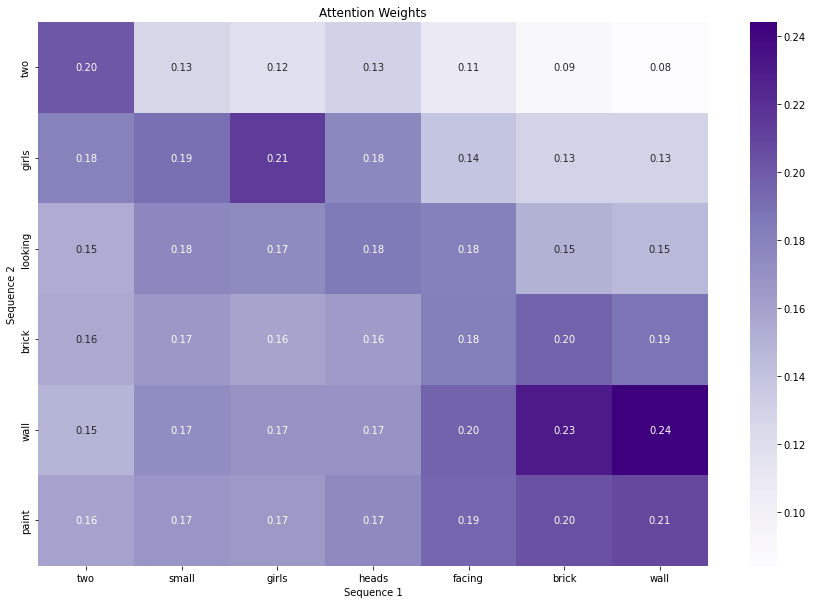

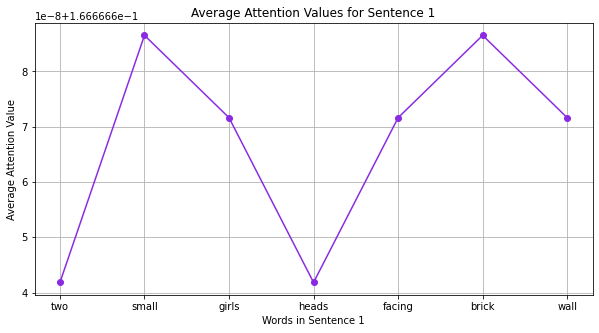

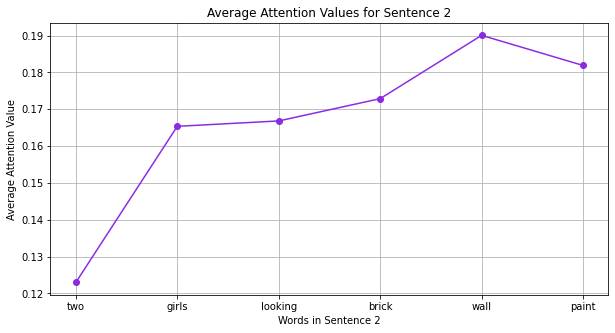

In [128]:
s1, s2, mat = visualize_random_pair_attention()
create_line_plot_of_attentions(s1, s2, mat)

A man wearing a white cowboy hat, blue shirt, and black vest, is riding a black bull at a rodeo stadium. - The only animal you can see here is a mouse. - contradiction
['man', 'wearing', 'white', 'cowboy', 'hat', 'blue', 'shirt', 'black', 'vest', 'riding', 'black', 'bull', 'rodeo', 'stadium']
['animal', 'see', 'mouse']
[2158, 4147, 2317, 11762, 6045, 2630, 3797, 2304, 17447, 5559, 2304, 7087, 18936, 3346] [4111, 2156, 8000]
(3, 14)


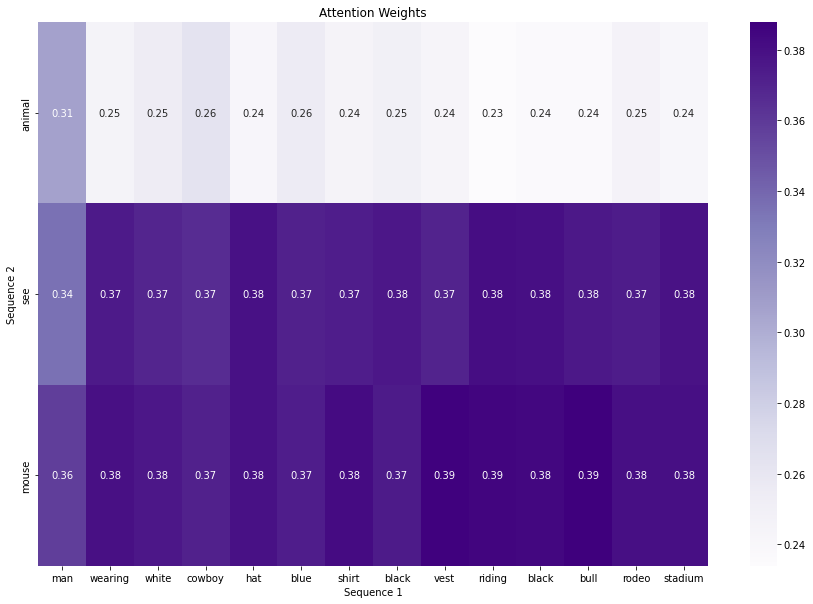

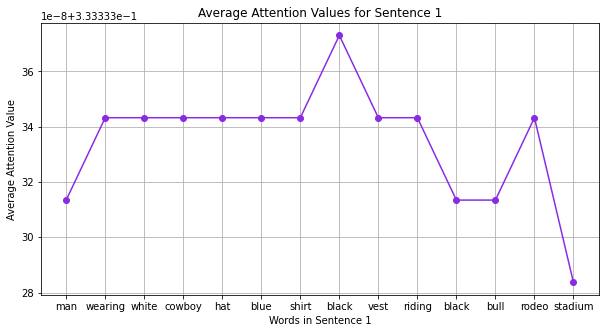

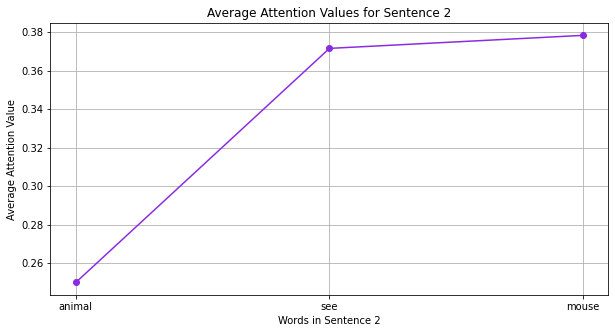

In [135]:
s1, s2, mat = visualize_random_pair_attention()
create_line_plot_of_attentions(s1, s2, mat)

A group of people are circled around four people playing various drums. - People are playing flutes while others gather around them. - contradiction
['group', 'people', 'circled', 'around', 'four', 'people', 'playing', 'various', 'drums']
['people', 'playing', 'flutes', 'others', 'gather', 'around']
[2177, 2111, 14867, 2105, 2176, 2111, 2652, 2536, 3846] [2111, 2652, 28453, 2500, 8587, 2105]
(6, 9)


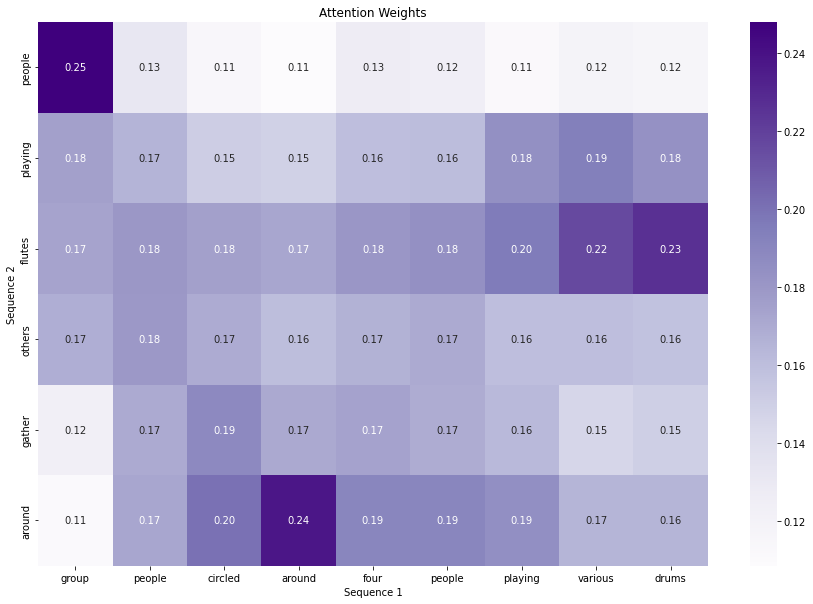

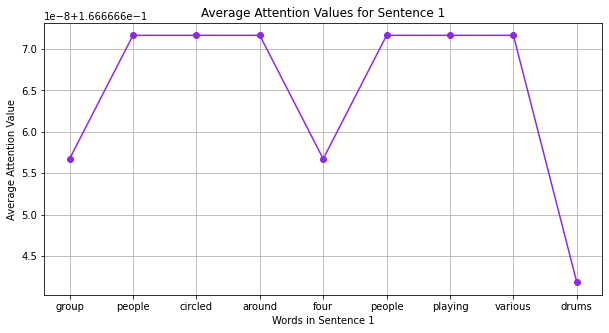

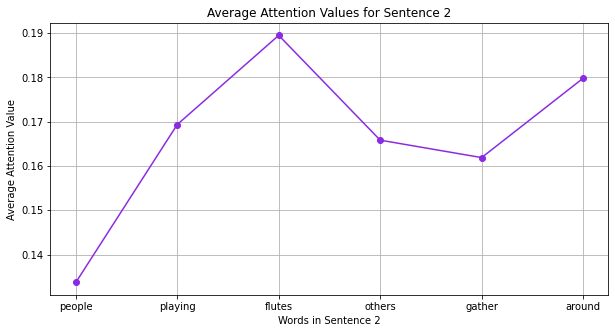

In [133]:
s1, s2, mat = visualize_random_pair_attention()
create_line_plot_of_attentions(s1, s2, mat)

A woman is wearing a sash while waving. - A woman wearing a sash is gesturing. - entailment
['woman', 'wearing', 'sash', 'waving']
['woman', 'wearing', 'sash', 'gesturing']
[2450, 4147, 24511, 12015] [2450, 4147, 24511, 22317]
(4, 4)


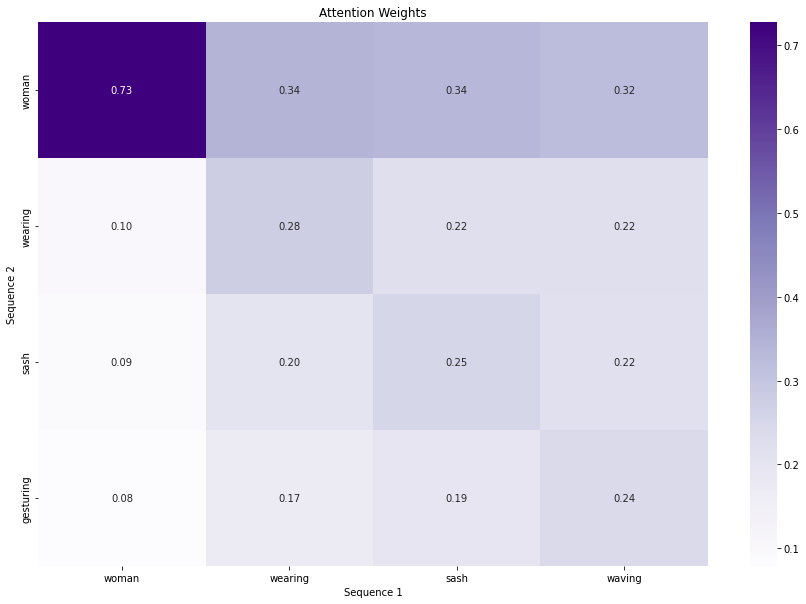

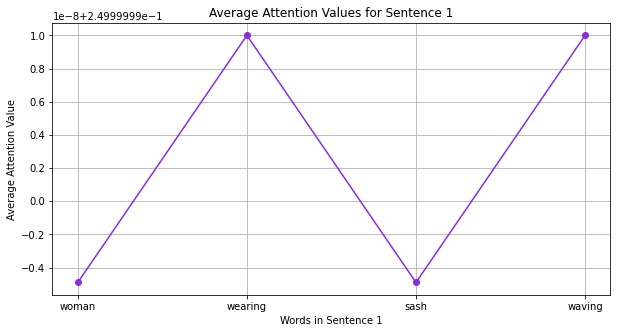

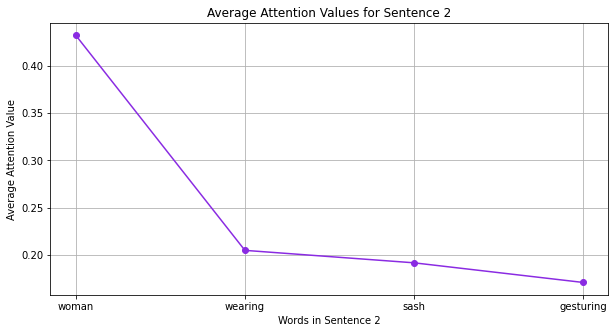

In [136]:
s1, s2, mat = visualize_random_pair_attention()
create_line_plot_of_attentions(s1, s2, mat)

Four people from a firefighting station in a different country are wearing yellow hard hats while battling a fire. - A group of firefighters are getting ready for a call. - neutral
['four', 'people', 'fire', 'station', 'different', 'country', 'wearing', 'yellow', 'hard', 'hats', 'battling', 'fire']
['group', 'firefighters', 'getting', 'ready', 'call']
[2176, 2111, 2543, 2276, 2367, 2406, 4147, 3756, 2524, 16717, 17773, 2543] [2177, 21767, 2893, 3201, 2655]
(5, 12)


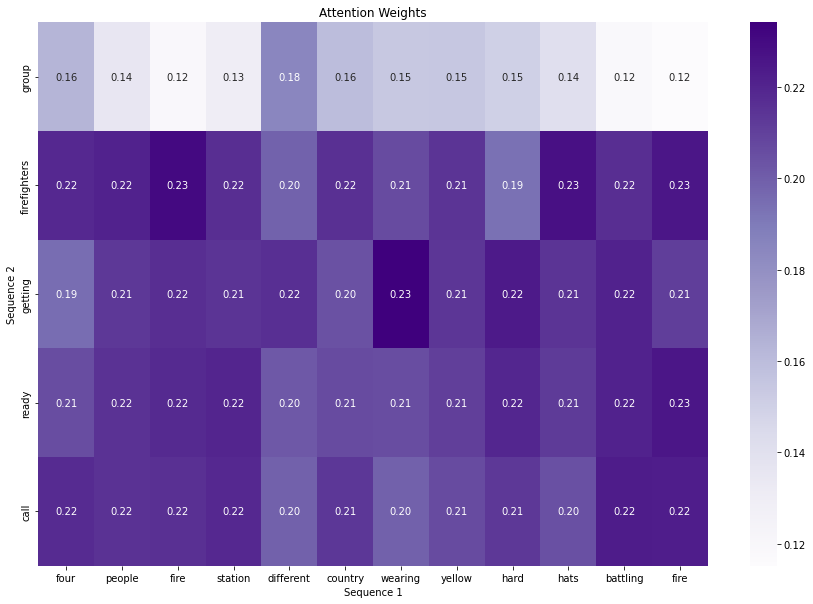

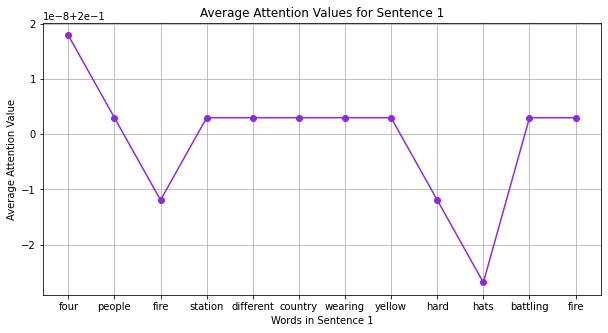

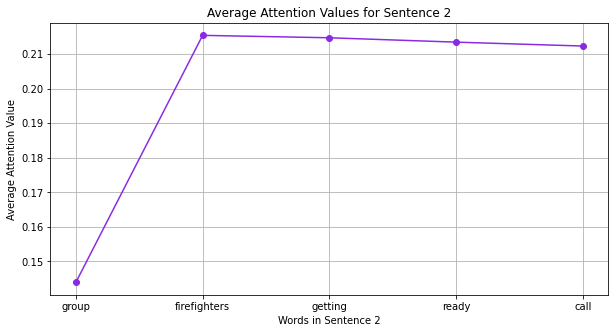

In [137]:
s1, s2, mat = visualize_random_pair_attention()
create_line_plot_of_attentions(s1, s2, mat)

A lady in brown T-shirt and jeans, dog walking. - A woman runs a dog walking business. - neutral
['lady', 'brown', 'shirt', 'jeans', 'dog', 'walking']
['woman', 'runs', 'dog', 'walking', 'business']
[3203, 2829, 3797, 6312, 3899, 3788] [2450, 3216, 3899, 3788, 2449]
(5, 6)


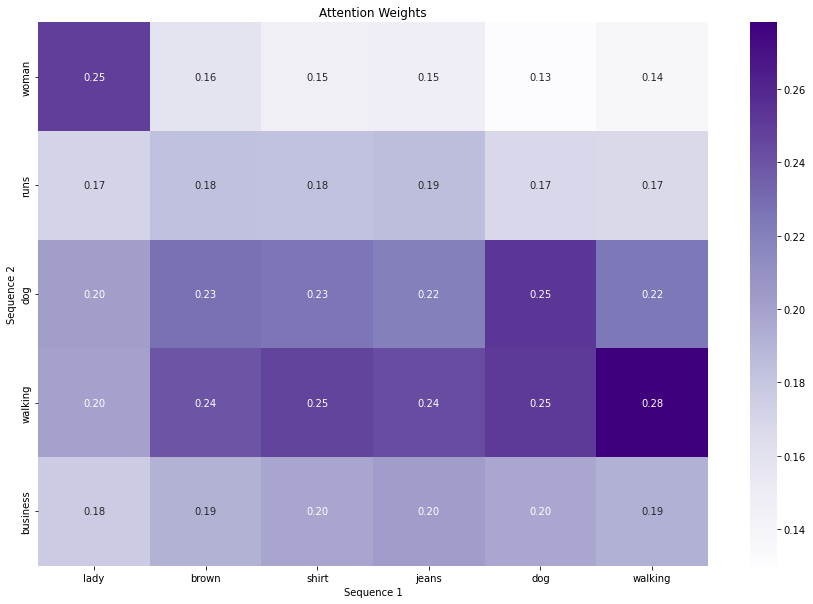

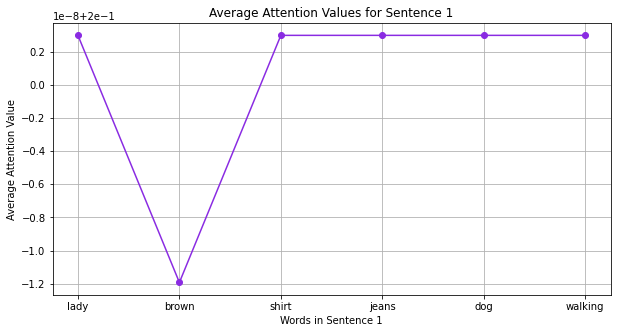

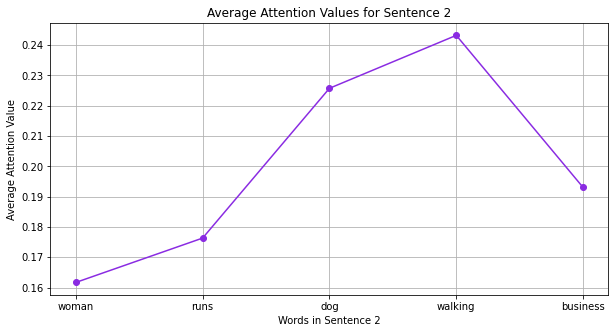

In [138]:
s1, s2, mat = visualize_random_pair_attention()
create_line_plot_of_attentions(s1, s2, mat)

A young boy swinging upside down from a bar. - An old man is swinging from a bar. - contradiction
['young', 'boy', 'swinging', 'upside', 'bar']
['old', 'man', 'swinging', 'bar']
[2402, 2879, 11820, 14961, 3347] [2214, 2158, 11820, 3347]
(4, 5)


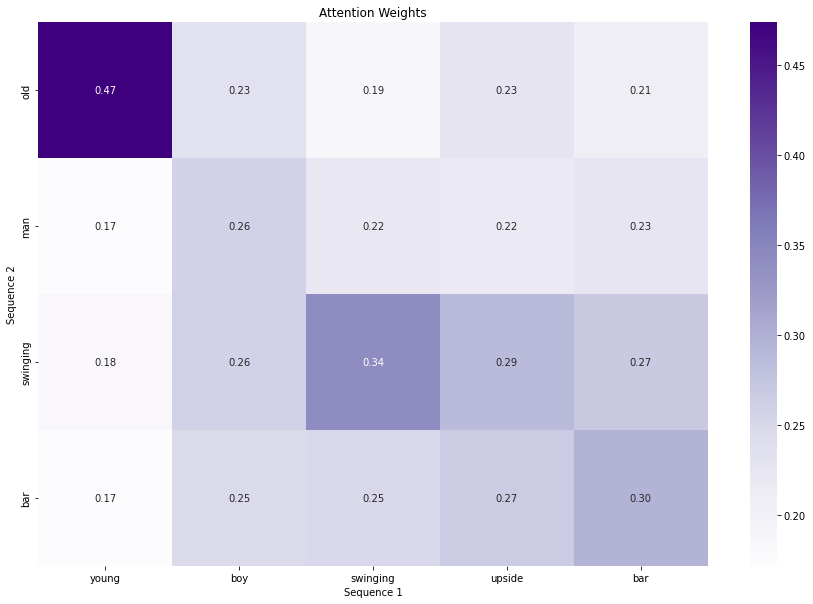

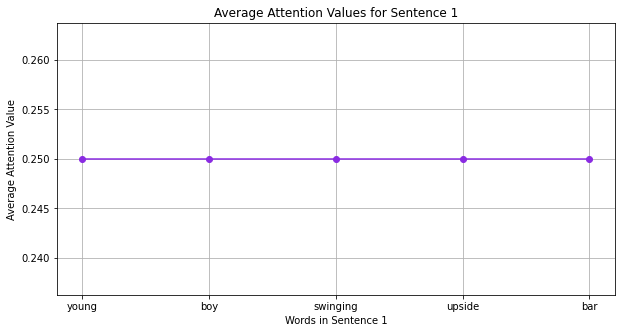

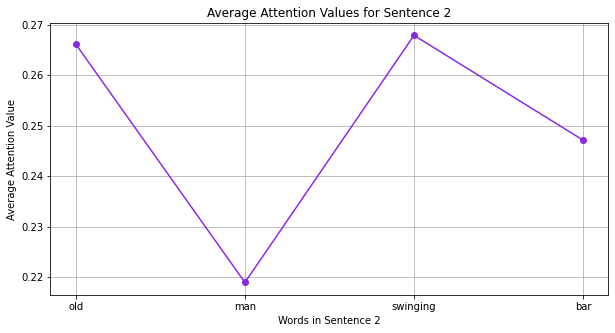

In [139]:
s1, s2, mat = visualize_random_pair_attention()
create_line_plot_of_attentions(s1, s2, mat)

Several people are in a building looking at several bicycles, and the person near the front has a blue shirt. - There is at least two people. - entailment
['several', 'people', 'building', 'looking', 'several', 'bicycles', 'person', 'near', 'front', 'blue', 'shirt']
['least', 'two', 'people']
[2195, 2111, 2311, 2559, 2195, 21066, 2711, 2379, 2392, 2630, 3797] [2560, 2048, 2111]
(3, 11)


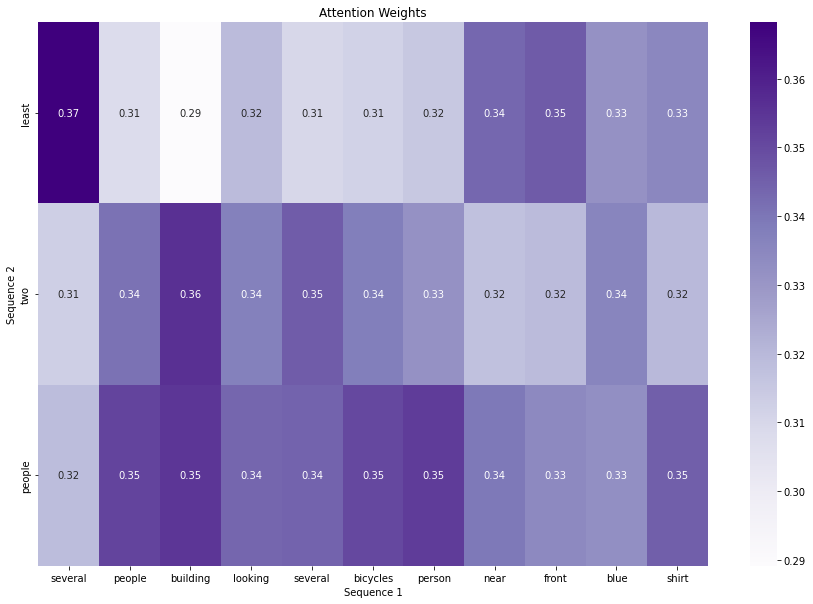

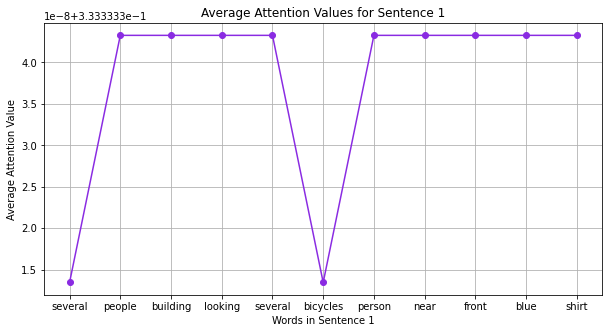

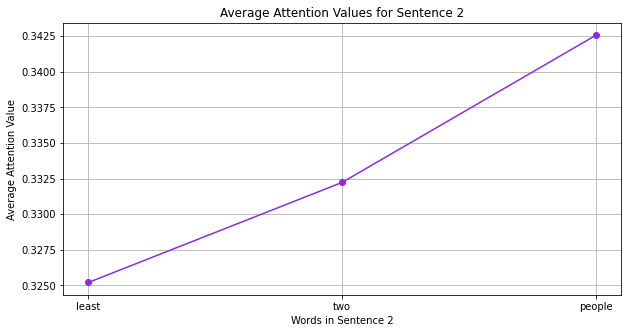

In [141]:
s1, s2, mat = visualize_random_pair_attention()
create_line_plot_of_attentions(s1, s2, mat)

Two men in a marathon climb over a tree in the forest. - Two men climb over a tree. - entailment
['two', 'men', 'marathon', 'climb', 'tree', 'forest']
['two', 'men', 'climb', 'tree']
[2048, 2273, 8589, 7105, 3392, 3224] [2048, 2273, 7105, 3392]
(4, 6)


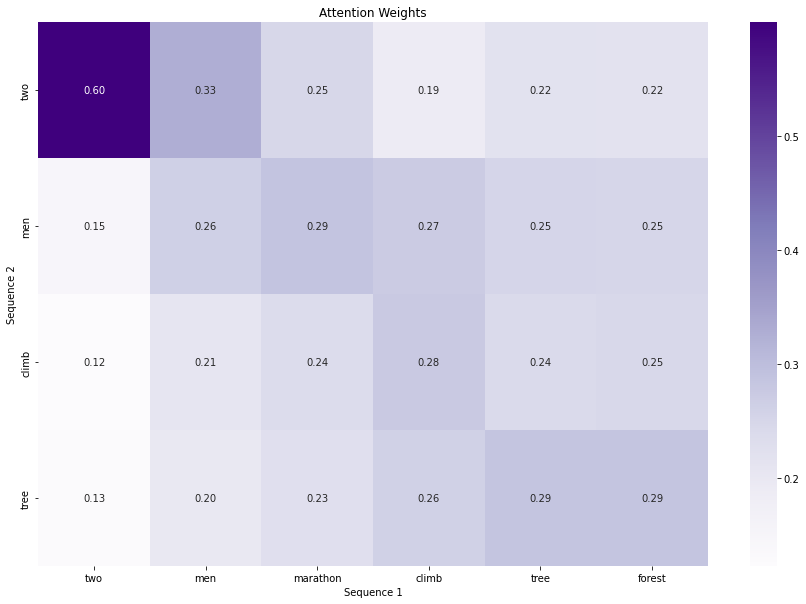

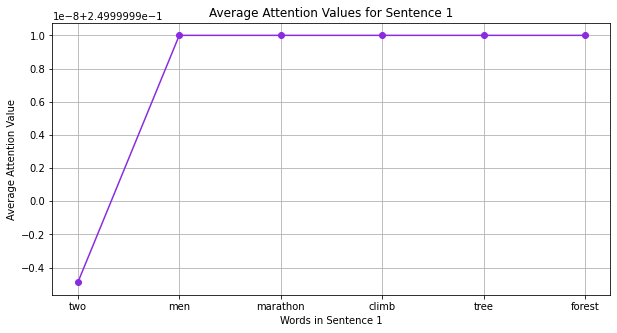

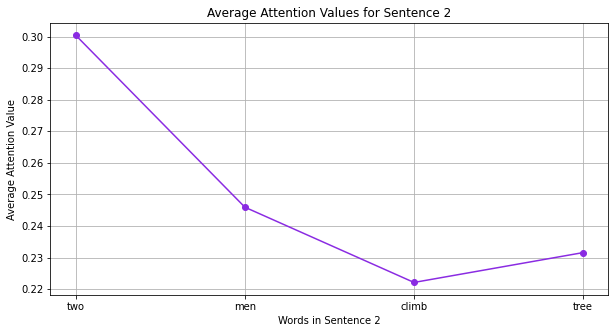

In [150]:
s1, s2, mat = visualize_random_pair_attention()
create_line_plot_of_attentions(s1, s2, mat)

A person in a red robe is showing a crowd of people a purple and red striped tube. - A person throws a toilet roll tube in the trash in his bathroom - contradiction
['person', 'red', 'robe', 'showing', 'crowd', 'people', 'purple', 'red', 'striped', 'tube']
['person', 'throws', 'toilet', 'roll', 'tube', 'trash', 'bathroom']
[2711, 2417, 11111, 4760, 4306, 2111, 6379, 2417, 17983, 7270] [2711, 11618, 11848, 4897, 7270, 11669, 5723]
(7, 10)


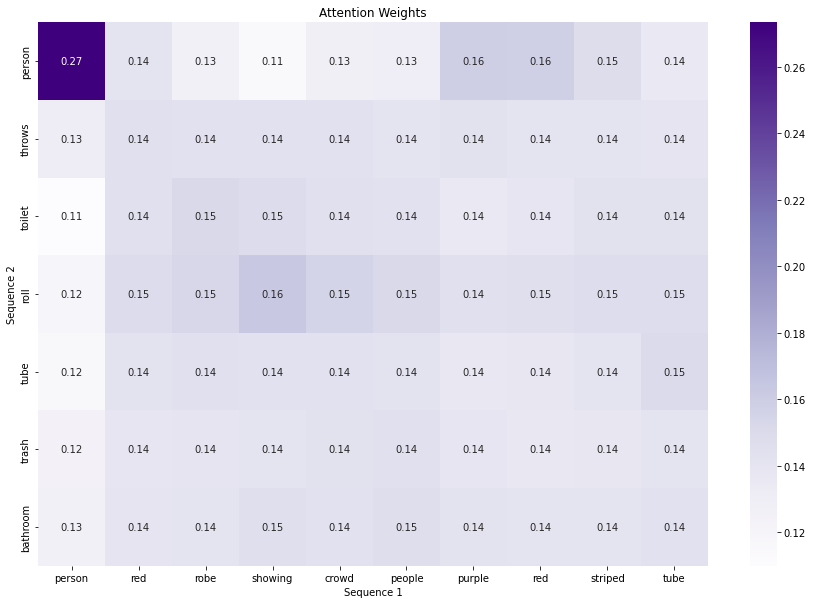

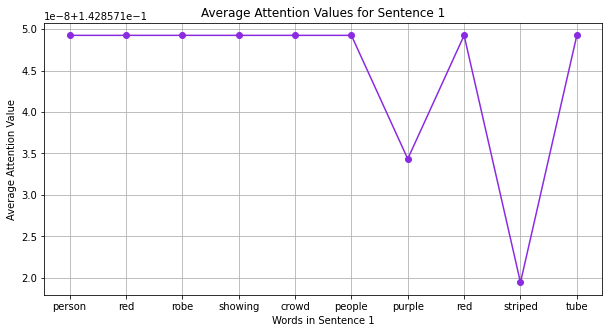

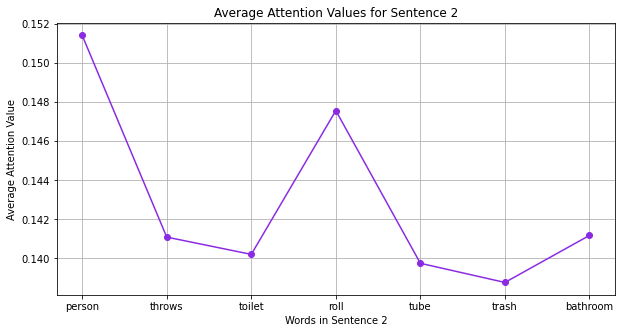

In [147]:
s1, s2, mat = visualize_random_pair_attention()
create_line_plot_of_attentions(s1, s2, mat)

In [152]:
random_row = data.sample(n=1)
sentence1 = random_row['sentence1'].item()
sentence2 = random_row['sentence2'].item()
rel = random_row['gold_label'].item()
print(sentence1, '-', sentence2, '-', rel)

model = BertModel.from_pretrained('bert-base-uncased', output_attentions=True)

# Tokenize the sentences
tokens = tokenizer.encode_plus(sentence1, sentence2, padding='longest', truncation=True, return_tensors='pt')
input_ids = tokens['input_ids']
attention_mask = tokens['attention_mask']

token_type_ids = tokens['token_type_ids']
attention = model(input_ids, token_type_ids=token_type_ids)[-1]
sentence_b_start = token_type_ids[0].tolist().index(1)
input_id_list = input_ids[0].tolist() # Batch index 0
t = tokenizer.convert_ids_to_tokens(input_id_list) 

outputs = model(input_ids, attention_mask=attention_mask, output_attentions=True)
attention_weights = outputs.attentions

    # Visualize cross-attention weights
head_view(attention, t, sentence_b_start)

A man in a tall red hat is riding on a green tractor and waving to spectators. - Someone is wearing a hat. - entailment


<IPython.core.display.Javascript object>